# car price prediction

problem statement : With the rise in the variety of cars with differentiated capabilities and features, we are bringing a car price prediction challenge for all. We all aspire to own a car within budget with the best features available.Through this project we will get to know which of the factors are significant and tell us how they affect the car's worth in the market

In [1]:
# importing necessary libraries

In [1]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from math import sqrt
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_error

In [2]:
data = pd.read_csv('car_price_prediction.csv')

# Understanding the data


In [3]:
data.head()

,ID,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags
0,45654403,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005 km,6.0,Automatic,4x4,04-May,Left wheel,Silver,12
1,44731507,16621,1018,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,192000 km,6.0,Tiptronic,4x4,04-May,Left wheel,Black,8
2,45774419,8467,-,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000 km,4.0,Variator,Front,04-May,Right-hand drive,Black,2
3,45769185,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966 km,4.0,Automatic,4x4,04-May,Left wheel,White,0
4,45809263,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901 km,4.0,Automatic,Front,04-May,Left wheel,Silver,4


In [4]:
data.shape


(19237, 18)

In [6]:
data.columns


Index(['ID', 'Price', 'Levy', 'Manufacturer', 'Model', 'Prod. year',
       'Category', 'Leather interior', 'Fuel type', 'Engine volume', 'Mileage',
       'Cylinders', 'Gear box type', 'Drive wheels', 'Doors', 'Wheel', 'Color',
       'Airbags'],
      dtype='object')

In [7]:
data.nunique()


ID                  18924
Price                2315
Levy                  559
Manufacturer           65
Model                1590
Prod. year             54
Category               11
Leather interior        2
Fuel type               7
Engine volume         107
Mileage              7687
Cylinders              13
Gear box type           4
Drive wheels            3
Doors                   3
Wheel                   2
Color                  16
Airbags                17
dtype: int64

In [8]:
data['Price'].describe()



count    1.923700e+04
mean     1.855593e+04
std      1.905813e+05
min      1.000000e+00
25%      5.331000e+03
50%      1.317200e+04
75%      2.207500e+04
max      2.630750e+07
Name: Price, dtype: float64

In [9]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19237 entries, 0 to 19236
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ID                19237 non-null  int64  
 1   Price             19237 non-null  int64  
 2   Levy              19237 non-null  object 
 3   Manufacturer      19237 non-null  object 
 4   Model             19237 non-null  object 
 5   Prod. year        19237 non-null  int64  
 6   Category          19237 non-null  object 
 7   Leather interior  19237 non-null  object 
 8   Fuel type         19237 non-null  object 
 9   Engine volume     19237 non-null  object 
 10  Mileage           19237 non-null  object 
 11  Cylinders         19237 non-null  float64
 12  Gear box type     19237 non-null  object 
 13  Drive wheels      19237 non-null  object 
 14  Doors             19237 non-null  object 
 15  Wheel             19237 non-null  object 
 16  Color             19237 non-null  object

Types of feature present in the dataset


In [10]:
cat_feature=[feature for feature in data.columns if data[feature].dtype=='O']
print(cat_feature)

['Levy', 'Manufacturer', 'Model', 'Category', 'Leather interior', 'Fuel type', 'Engine volume', 'Mileage', 'Gear box type', 'Drive wheels', 'Doors', 'Wheel', 'Color']


In [11]:
num_feature=[feature for feature in data.columns if data[feature].dtype!='O']
print(num_feature)

['ID', 'Price', 'Prod. year', 'Cylinders', 'Airbags']


# Cleaning the data


Checking for null values


In [12]:
data.isnull().sum()


ID                  0
Price               0
Levy                0
Manufacturer        0
Model               0
Prod. year          0
Category            0
Leather interior    0
Fuel type           0
Engine volume       0
Mileage             0
Cylinders           0
Gear box type       0
Drive wheels        0
Doors               0
Wheel               0
Color               0
Airbags             0
dtype: int64

we don't need ID feature now so we can drop it now


In [13]:
data = data.drop(['ID'],axis=1)


In [14]:
data.shape

(19237, 17)

The DataSet Contains 19237 rows & 17 columns.


Cleaning the noisy values in the features


checking for wrong entries such as special symbols e.g -,?,*,#,$ etc.



In [15]:
data['Levy'].value_counts()


-       5819
765      486
891      461
639      410
640      405
        ... 
3156       1
2908       1
1279       1
1719       1
1901       1
Name: Levy, Length: 559, dtype: int64

In [16]:
for col in data.columns:
    print('{} : {}'.format(col, data[col].unique()))

Price : [13328 16621  8467 ... 56814 63886 22075]
Levy : ['1399' '1018' '-' '862' '446' '891' '761' '751' '394' '1053' '1055'
 '1079' '810' '2386' '1850' '531' '586' '1249' '2455' '583' '1537' '1288'
 '915' '1750' '707' '1077' '1486' '1091' '650' '382' '1436' '1194' '503'
 '1017' '1104' '639' '629' '919' '781' '530' '640' '765' '777' '779' '934'
 '769' '645' '1185' '1324' '830' '1187' '1111' '760' '642' '1604' '1095'
 '966' '473' '1138' '1811' '988' '917' '1156' '687' '11714' '836' '1347'
 '2866' '1646' '259' '609' '697' '585' '475' '690' '308' '1823' '1361'
 '1273' '924' '584' '2078' '831' '1172' '893' '1872' '1885' '1266' '447'
 '2148' '1730' '730' '289' '502' '333' '1325' '247' '879' '1342' '1327'
 '1598' '1514' '1058' '738' '1935' '481' '1522' '1282' '456' '880' '900'
 '798' '1277' '442' '1051' '790' '1292' '1047' '528' '1211' '1493' '1793'
 '574' '930' '1998' '271' '706' '1481' '1677' '1661' '1286' '1408' '1090'
 '595' '1451' '1267' '993' '1714' '878' '641' '749' '1511' '603' '353

In [17]:
data['Levy'] = data['Levy'].replace(['-'],['0'])
data['Levy'] = data['Levy'].astype(str).astype(int)
data['Levy']

0        1399
1        1018
2           0
3         862
4         446
         ... 
19232       0
19233     831
19234     836
19235    1288
19236     753
Name: Levy, Length: 19237, dtype: int32

In [18]:
data.Manufacturer.unique()


array(['LEXUS', 'CHEVROLET', 'HONDA', 'FORD', 'HYUNDAI', 'TOYOTA',
       'MERCEDES-BENZ', 'OPEL', 'PORSCHE', 'BMW', 'JEEP', 'VOLKSWAGEN',
       'AUDI', 'RENAULT', 'NISSAN', 'SUBARU', 'DAEWOO', 'KIA',
       'MITSUBISHI', 'SSANGYONG', 'MAZDA', 'GMC', 'FIAT', 'INFINITI',
       'ALFA ROMEO', 'SUZUKI', 'ACURA', 'LINCOLN', 'VAZ', 'GAZ',
       'CITROEN', 'LAND ROVER', 'MINI', 'DODGE', 'CHRYSLER', 'JAGUAR',
       'ISUZU', 'SKODA', 'DAIHATSU', 'BUICK', 'TESLA', 'CADILLAC',
       'PEUGEOT', 'BENTLEY', 'VOLVO', 'სხვა', 'HAVAL', 'HUMMER', 'SCION',
       'UAZ', 'MERCURY', 'ZAZ', 'ROVER', 'SEAT', 'LANCIA', 'MOSKVICH',
       'MASERATI', 'FERRARI', 'SAAB', 'LAMBORGHINI', 'ROLLS-ROYCE',
       'PONTIAC', 'SATURN', 'ASTON MARTIN', 'GREATWALL'], dtype=object)

In [19]:
data['Manufacturer'].value_counts()


HYUNDAI          3769
TOYOTA           3662
MERCEDES-BENZ    2076
FORD             1111
CHEVROLET        1069
                 ... 
TESLA               1
PONTIAC             1
SATURN              1
ASTON MARTIN        1
GREATWALL           1
Name: Manufacturer, Length: 65, dtype: int64

In [20]:
data['Engine volume'].unique()


array(['3.5', '3', '1.3', '2.5', '2', '1.8', '2.4', '4', '1.6', '3.3',
       '2.0 Turbo', '2.2 Turbo', '4.7', '1.5', '4.4', '3.0 Turbo',
       '1.4 Turbo', '3.6', '2.3', '1.5 Turbo', '1.6 Turbo', '2.2',
       '2.3 Turbo', '1.4', '5.5', '2.8 Turbo', '3.2', '3.8', '4.6', '1.2',
       '5', '1.7', '2.9', '0.5', '1.8 Turbo', '2.4 Turbo', '3.5 Turbo',
       '1.9', '2.7', '4.8', '5.3', '0.4', '2.8', '3.2 Turbo', '1.1',
       '2.1', '0.7', '5.4', '1.3 Turbo', '3.7', '1', '2.5 Turbo', '2.6',
       '1.9 Turbo', '4.4 Turbo', '4.7 Turbo', '0.8', '0.2 Turbo', '5.7',
       '4.8 Turbo', '4.6 Turbo', '6.7', '6.2', '1.2 Turbo', '3.4',
       '1.7 Turbo', '6.3 Turbo', '2.7 Turbo', '4.3', '4.2', '2.9 Turbo',
       '0', '4.0 Turbo', '20', '3.6 Turbo', '0.3', '3.7 Turbo', '5.9',
       '5.5 Turbo', '0.2', '2.1 Turbo', '5.6', '6', '0.7 Turbo',
       '0.6 Turbo', '6.8', '4.5', '0.6', '7.3', '0.1', '1.0 Turbo', '6.3',
       '4.5 Turbo', '0.8 Turbo', '4.2 Turbo', '3.1', '5.0 Turbo', '6.4',
       '3

The presence of 'Turbo' leads to the entire column being declared of datatype 'object'.



Lets create a new feature to show whether the engine is turbo or not


In [21]:
data['engine_turbo'] = np.where(data['Engine volume'].str.contains('Turbo'), 1, 0)

In [22]:
data['Engine volume']=data['Engine volume'].str.replace('Turbo','')
data['Engine volume']= data['Engine volume'].astype(str).astype(float)

In [23]:
data['Engine volume'].unique()


array([ 3.5,  3. ,  1.3,  2.5,  2. ,  1.8,  2.4,  4. ,  1.6,  3.3,  2.2,
        4.7,  1.5,  4.4,  1.4,  3.6,  2.3,  5.5,  2.8,  3.2,  3.8,  4.6,
        1.2,  5. ,  1.7,  2.9,  0.5,  1.9,  2.7,  4.8,  5.3,  0.4,  1.1,
        2.1,  0.7,  5.4,  3.7,  1. ,  2.6,  0.8,  0.2,  5.7,  6.7,  6.2,
        3.4,  6.3,  4.3,  4.2,  0. , 20. ,  0.3,  5.9,  5.6,  6. ,  0.6,
        6.8,  4.5,  7.3,  0.1,  3.1,  6.4,  3.9,  0.9,  5.2,  5.8])

In [24]:
data['Mileage']


0        186005 km
1        192000 km
2        200000 km
3        168966 km
4         91901 km
           ...    
19232    300000 km
19233    161600 km
19234    116365 km
19235     51258 km
19236    186923 km
Name: Mileage, Length: 19237, dtype: object

removing km will be good to converting it to int



In [25]:
data['Mileage'] = data['Mileage'].apply(lambda x : str(x).replace("km"," "))
data['Mileage'] = data['Mileage'].astype(str).astype(int)

In [26]:
data['Mileage'].head(5)


0    186005
1    192000
2    200000
3    168966
4     91901
Name: Mileage, dtype: int32

In [27]:
data['Doors'].unique()


array(['04-May', '02-Mar', '>5'], dtype=object)

removing -may , -mar to appear as no. of doors not like a date



In [28]:
data['Doors'] = data['Doors'].str.replace('4-May','4')
data['Doors'] = data['Doors'].str.replace('2-Mar','2')

In [29]:
data['Doors'].head(5)


0    04
1    04
2    04
3    04
4    04
Name: Doors, dtype: object

In [30]:
data['Wheel'].unique()


array(['Left wheel', 'Right-hand drive'], dtype=object)

# Data Exploration


In [31]:
import plotly.express as px


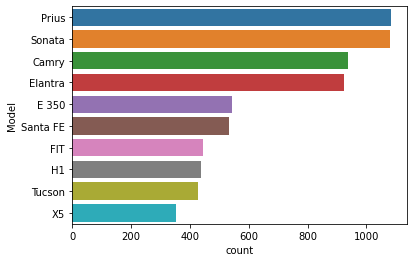

In [32]:
sns.countplot(y ='Model',data = data,order=data.Model.value_counts().iloc[:10].index )
plt.show()

observation:from this graph, prius and sonata have the highest count 

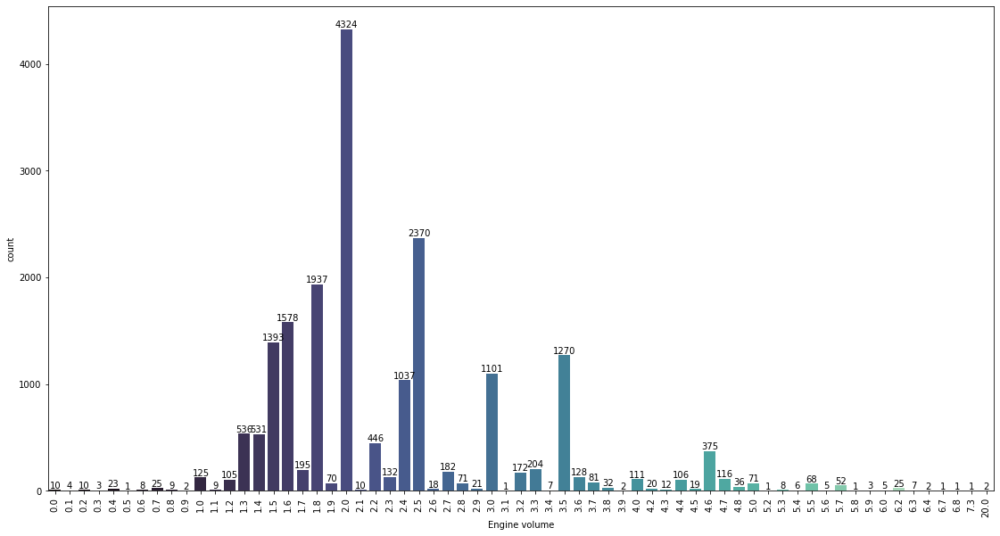

In [33]:
plt.figure(figsize=(19,10))
c1=sns.countplot(x='Engine volume',data=data,palette="mako")
plt.xticks(rotation=90)
c1.bar_label(c1.containers[0],size = 10)
plt.show()

observation:in Engine volume 2.0 has the highest count with the 4259

In [34]:
fig = px.line(data, x='Price')
fig.show()

large outlier appear in the price feature


remove the biggest outliers to see & explore the data better


In [35]:
data['Price'] = data['Price'].replace([627220, 872946,26307500], data['Price'].median())


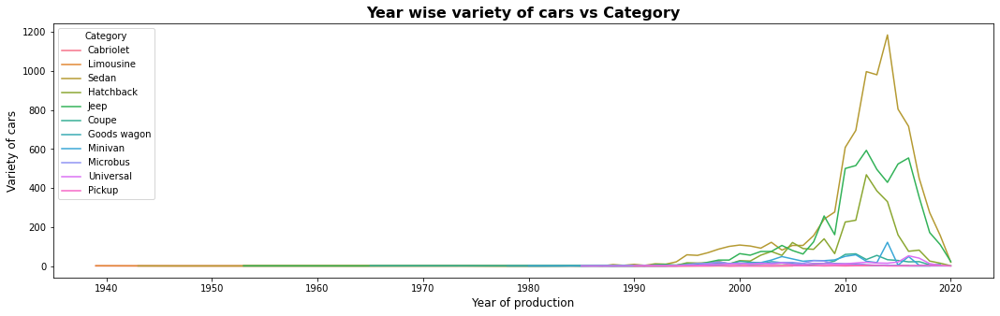

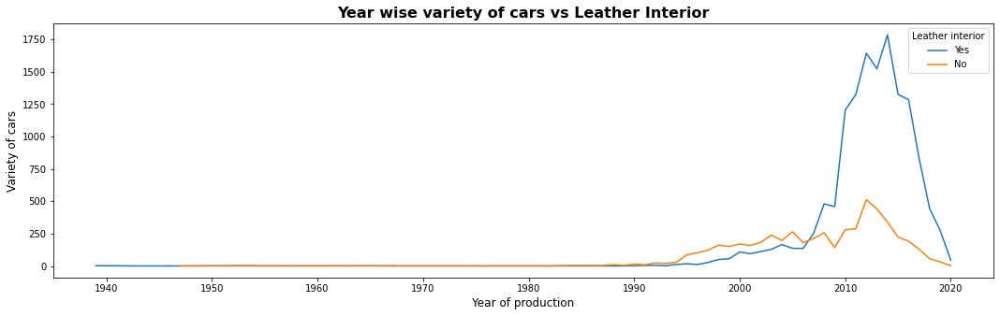

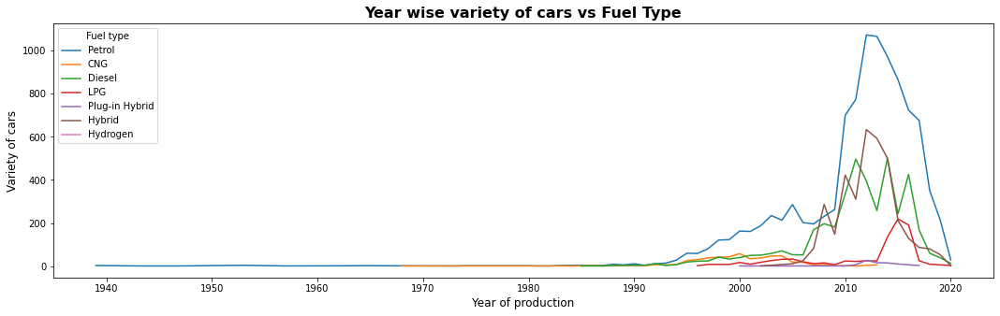

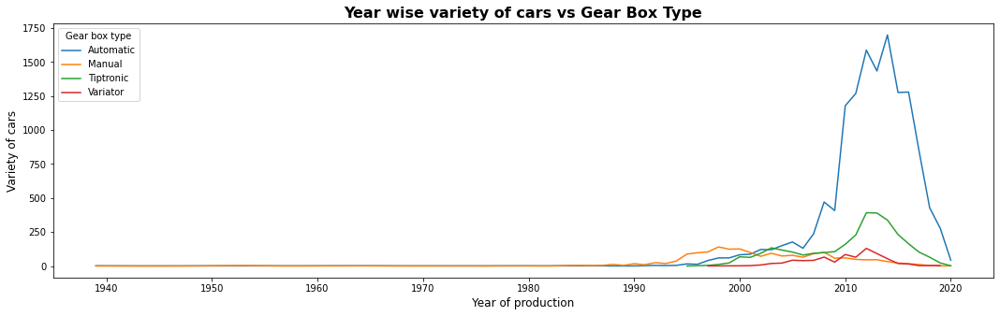

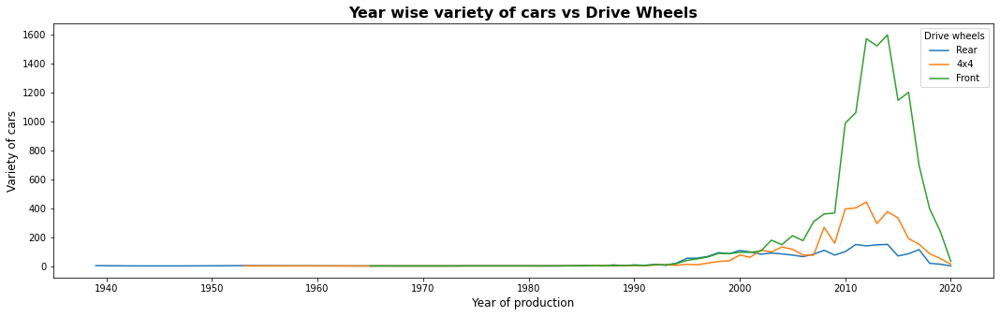

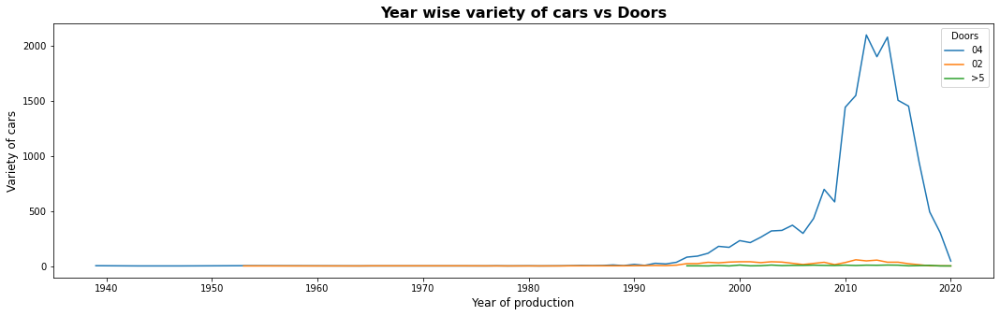

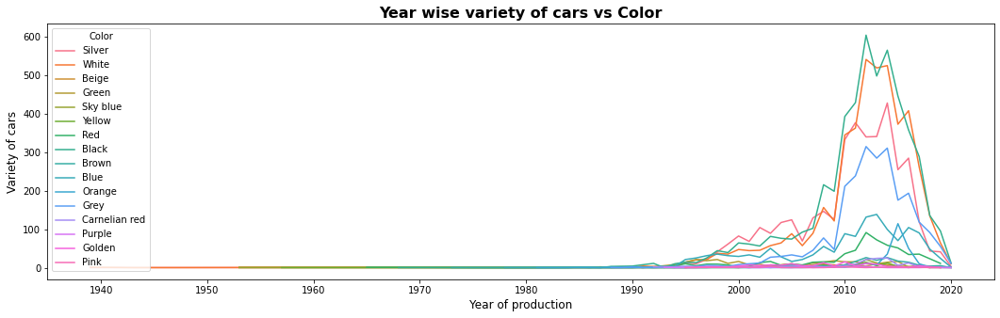

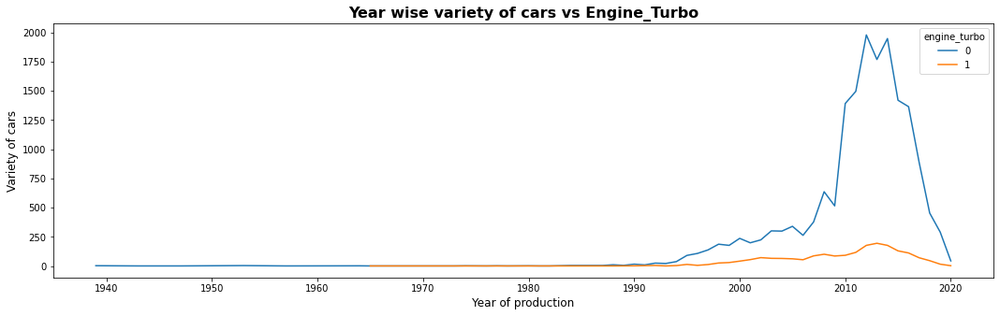

In [36]:
cat_col  = ['Category', 'Leather interior', 'Fuel type', 'Gear box type', 'Drive wheels', 'Doors', 'Color', 'engine_turbo']
for hue in cat_col:
    plt.figure(figsize=(18,5))
    df1 = data[['Prod. year',hue, 'Price']].groupby(by= ['Prod. year',hue], as_index=True).count().reset_index()
    plot = sns.lineplot(x = 'Prod. year', y = 'Price',  data = df1, hue = hue)
    plt.title(f'Year wise variety of cars vs {hue.title()}', fontsize=16,weight='bold')
    plt.xlabel('Year of production', fontsize=12)
    plt.ylabel('Variety of cars', fontsize=12)
    plt.show()

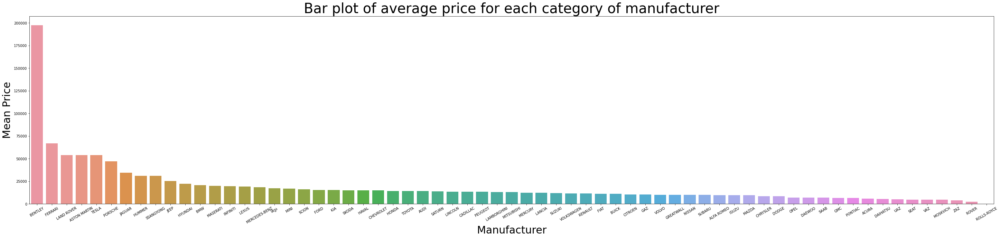

In [40]:
df1 = data[['Price', 'Manufacturer']].groupby(by= ['Manufacturer'], as_index=False).agg('mean').sort_values(by='Price', ascending=False)

# Lets barplot for each categorical columns
plt.figure(figsize=(50,10))

plot = sns.barplot(x="Manufacturer", y="Price", data=df1)
plot.set_xticklabels(plot.get_xticklabels(), rotation=30, horizontalalignment='center')
plt.title('Bar plot of average price for each category of manufacturer', fontsize=40)
plt.xlabel('Manufacturer', fontsize=30)
plt.ylabel('Mean Price', fontsize=30)


plt.show()

<AxesSubplot:xlabel='Doors', ylabel='Price'>

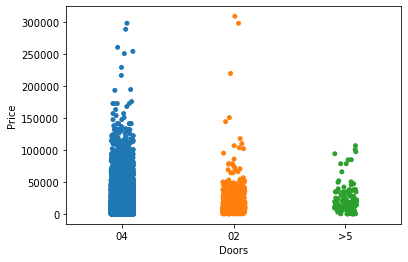

In [37]:
sns.stripplot(data=data, y='Price', x= 'Doors')


observation : The car with 4 doors have high price

<AxesSubplot:xlabel='Doors', ylabel='count'>

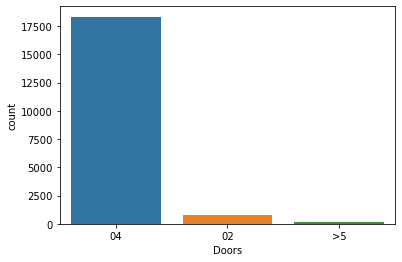

In [38]:
sns.countplot(data=data,  x= 'Doors')


observation : The car having 4 doors have the highest count

<AxesSubplot:>

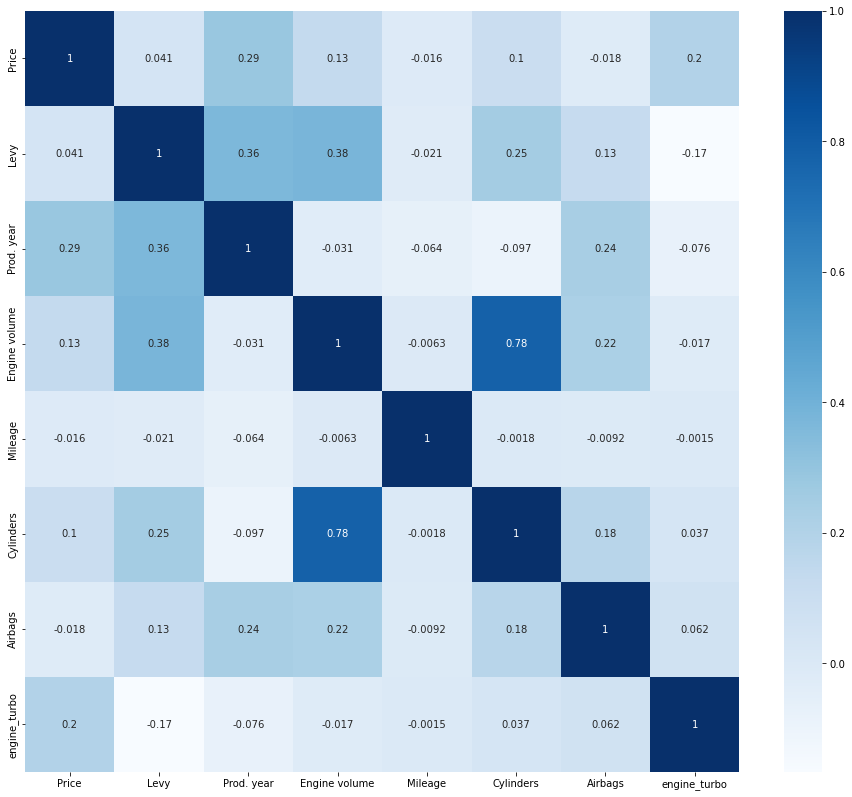

In [39]:
plt.figure(figsize=(16, 14))
sns.heatmap(data.corr(), cbar=True, annot=True, cmap='Blues')

In [40]:
cat_cols = data.select_dtypes(include='object').columns
cat_cols

Index(['Manufacturer', 'Model', 'Category', 'Leather interior', 'Fuel type',
       'Gear box type', 'Drive wheels', 'Doors', 'Wheel', 'Color'],
      dtype='object')

In [41]:
for i in cat_cols:
        boxp = px.box(data_frame=data,x=i,y='Price')
        boxp.show()

In [42]:
time_added2 = data.groupby("Prod. year")[["Manufacturer"]].count()
time_added2

,Manufacturer
Prod. year,
1939,3
1943,1
1947,1
1953,4
1957,1
1964,2
1965,2
1968,1
1973,1


observation : in the above we can understand ffrom 2010 to 2016 has the highest manufacturer count

<AxesSubplot:xlabel='Prod. year'>

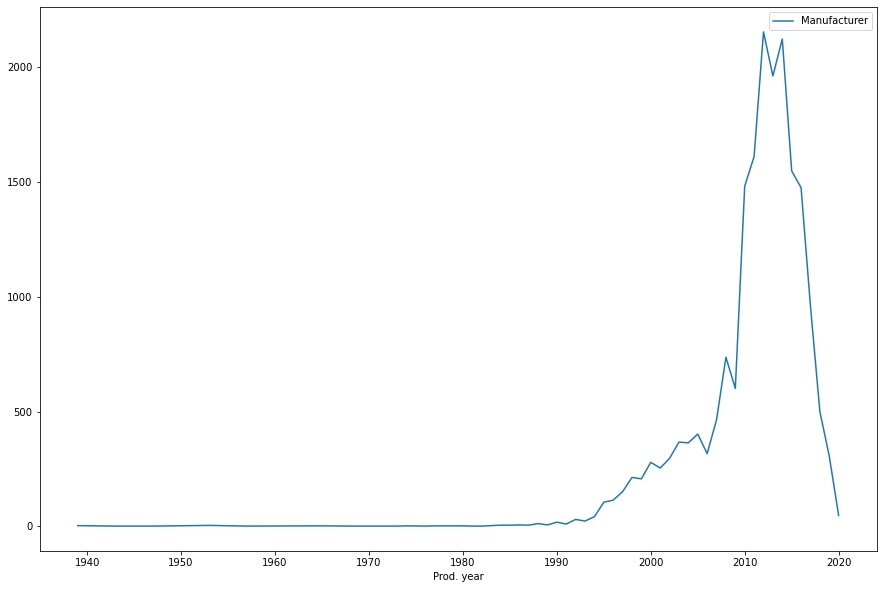

In [43]:
time_added2.plot(figsize=(15,10))


In [44]:
data['Age'] = 2020 - data['Prod. year']


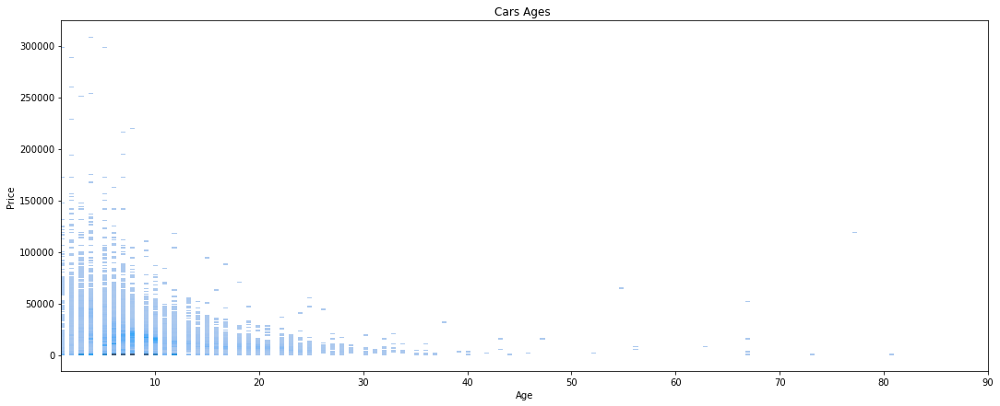

In [46]:
f, ax = plt.subplots(figsize=(18, 7))
sns.histplot(data=data, x="Age",y='Price')
ax.set_xlim(1,90)
plt.title('Cars Ages ')
plt.show()

observation :in the above graph,smaller the age of the car the price will be high,as age increases the price will be less

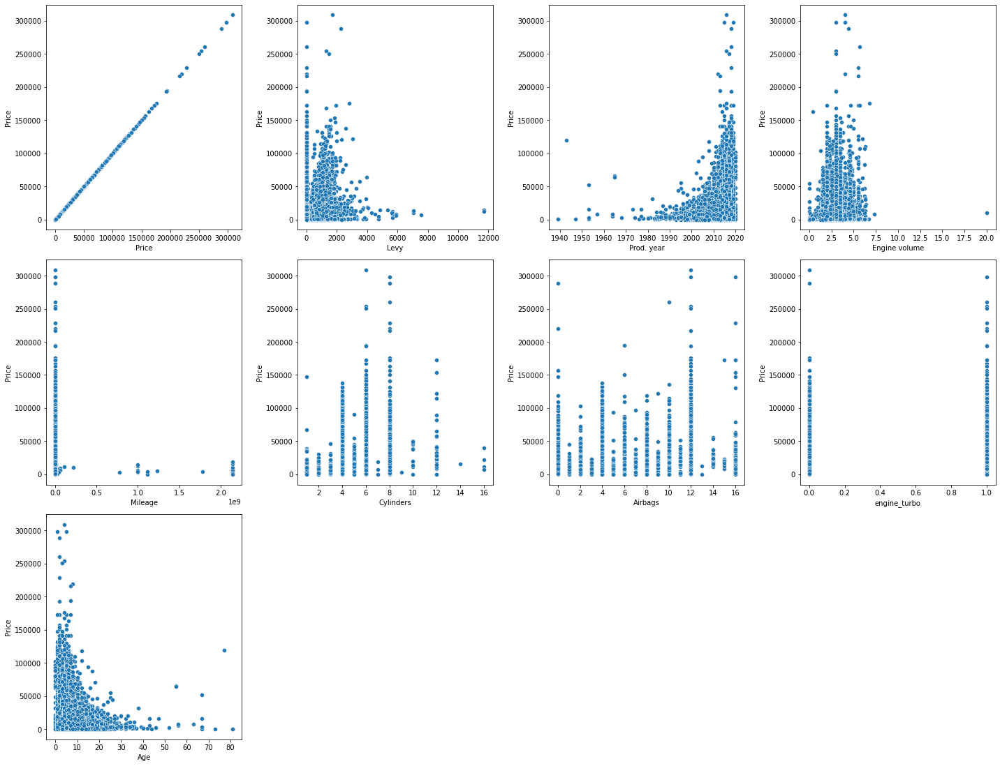

In [47]:
cols = 4
rows = 4
num_cols = data.select_dtypes(exclude='object').columns
fig = plt.figure( figsize=(cols*5, rows*5))
for i, col in enumerate(num_cols):
    
    ax=fig.add_subplot(rows,cols,i+1)
    
    sns.scatterplot(x = data[col], ax = ax,y=data['Price'])
    
fig.tight_layout()  
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

C:\Users\ashish\AppData\Local\Temp\ipykernel_10516\1660949924.py:9: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future ve

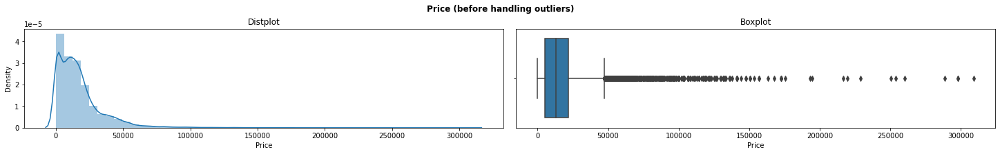

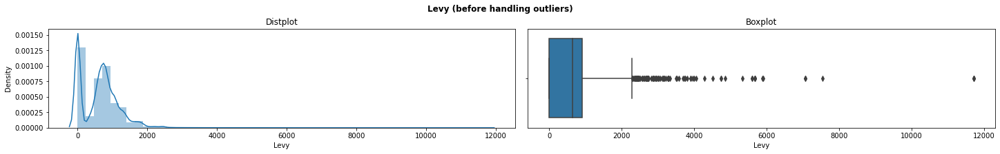

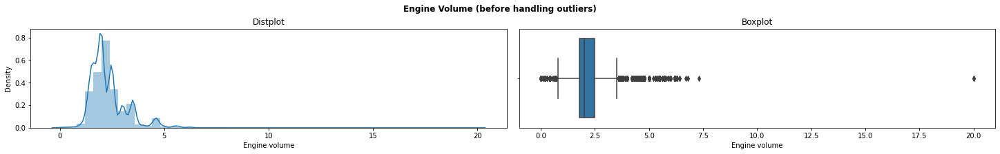

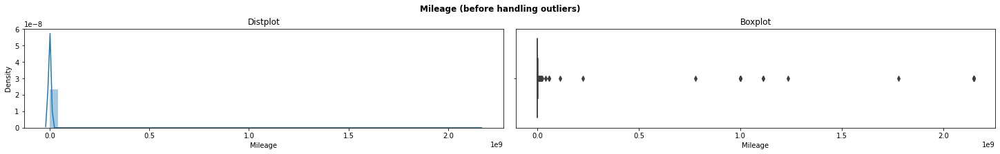

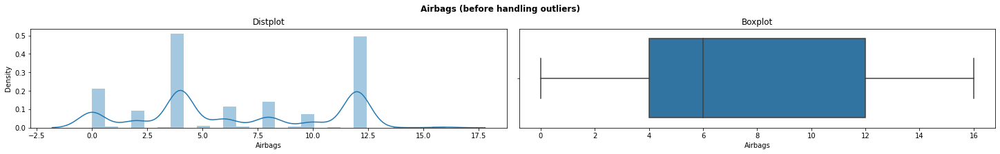

In [50]:
cont_col = ['Price', 'Levy',  'Engine volume', 'Mileage', 'Airbags']

for col in cont_col:
    fig, ax =plt.subplots(1,2, constrained_layout=True)
    fig.set_size_inches(20, 3)
    sns.distplot(data[col], ax=ax[0]).set(title="Distplot")
    sns.boxplot(data[col], ax=ax[1]).set(title="Boxplot")
    plt.suptitle(f'{col.title()} (before handling outliers)',weight='bold')
    fig.show()

In [51]:
data[cont_col].describe()


,Price,Levy,Engine volume,Mileage,Airbags
count,19237.000000,19237.000000,19237.000000,1.923700e+04,19237.000000
mean,17112.451110,632.528669,2.307990,1.532236e+06,6.582627
std,18277.288517,567.721688,0.877805,4.840387e+07,4.320168
min,1.000000,0.000000,0.000000,0.000000e+00,0.000000
25%,5331.000000,0.000000,1.800000,7.013900e+04,4.000000
50%,13172.000000,642.000000,2.000000,1.260000e+05,6.000000
75%,22063.000000,917.000000,2.500000,1.888880e+05,12.000000
max,308906.000000,11714.000000,20.000000,2.147484e+09,16.000000


In [52]:
data['Price'].describe()


count     19237.000000
mean      17112.451110
std       18277.288517
min           1.000000
25%        5331.000000
50%       13172.000000
75%       22063.000000
max      308906.000000
Name: Price, dtype: float64

In [53]:
def outlier_prcnt(data, col_list):
    for col_name in col_list:
        q1 = data[col_name].quantile(0.25)
        q3 = data[col_name].quantile(0.75)
        iqr = q3-q1  #IQR
        fence_low  = q1-1.5*iqr
        fence_high = q3+1.5*iqr

        
        outliers = ((data[col_name] > fence_high) | (data[col_name] < fence_low)).sum()
        total = data[col_name].shape[0]
        print(f"Total outliers in {col_name} are: {outliers} - {round(100*(outliers)/total,2)}%.")

outlier_prcnt(data, cont_col)

Total outliers in Price are: 1070 - 5.56%.
Total outliers in Levy are: 161 - 0.84%.
Total outliers in Engine volume are: 1381 - 7.18%.
Total outliers in Mileage are: 640 - 3.33%.
Total outliers in Airbags are: 0 - 0.0%.


# IQR

In [54]:
def outlier_handle(data, col_list):
    df_new = data.copy()
    for col_name in col_list:
        q1 = data[col_name].quantile(0.25)
        q3 = data[col_name].quantile(0.75)
        iqr = q3-q1  #IQR
        fence_low  = q1-1.5*iqr
        fence_high = q3+1.5*iqr

        # Capping Outliers using IQR method
        df_new.loc[:,  col_name] = np.where(data[col_name]> fence_high, fence_high,
                                         np.where(data[col_name]< fence_low, fence_low,
                                                  data[col_name]))
    return df_new
# Lets get the amount of outliers in each numerical columns
data = outlier_handle(data, cont_col)

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

C:\Users\ashish\AppData\Local\Temp\ipykernel_10516\1917281356.py:7: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future ve

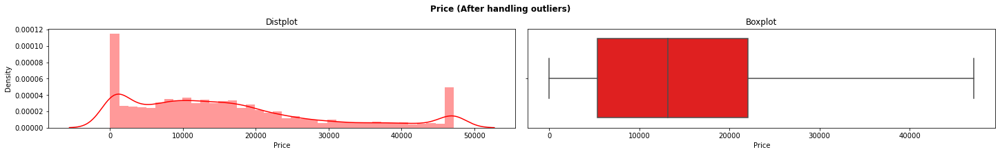

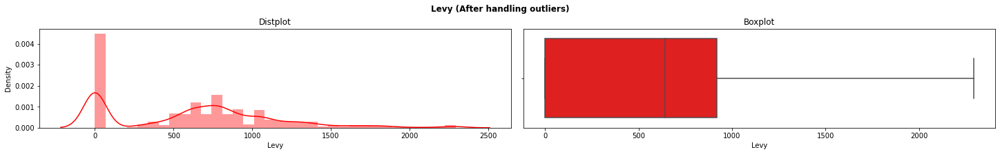

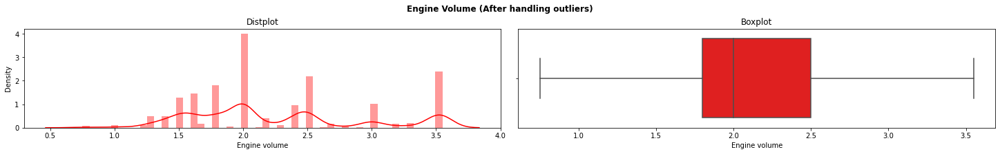

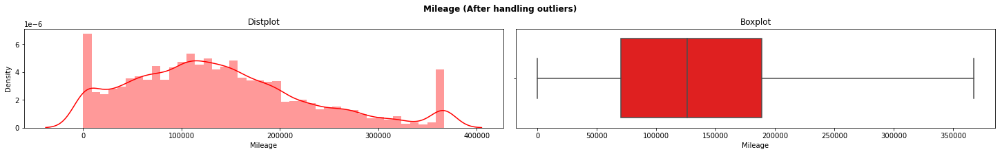

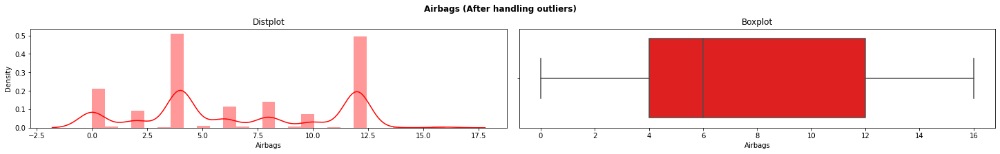

In [55]:
for col in cont_col:
    fig, ax =plt.subplots(1,2, constrained_layout=True)
    fig.set_size_inches(20, 3)
    sns.distplot(data[col], ax=ax[0],color='red').set(title="Distplot")
    sns.boxplot(data[col], ax=ax[1],color='red').set(title="Boxplot")
    plt.suptitle(f'{col.title()} (After handling outliers)',weight='bold')
    fig.show()

In [56]:
data[cont_col].describe()


,Price,Levy,Engine volume,Mileage,Airbags
count,19237.000000,19237.000000,19237.000000,19237.000000,19237.000000
mean,15867.879295,625.239772,2.240830,137306.013724,6.582627
std,13413.141330,520.809881,0.684351,90663.136436,4.320168
min,1.000000,0.000000,0.750000,0.000000,0.000000
25%,5331.000000,0.000000,1.800000,70139.000000,4.000000
50%,13172.000000,642.000000,2.000000,126000.000000,6.000000
75%,22063.000000,917.000000,2.500000,188888.000000,12.000000
max,47161.000000,2292.500000,3.550000,367011.500000,16.000000


<AxesSubplot:>

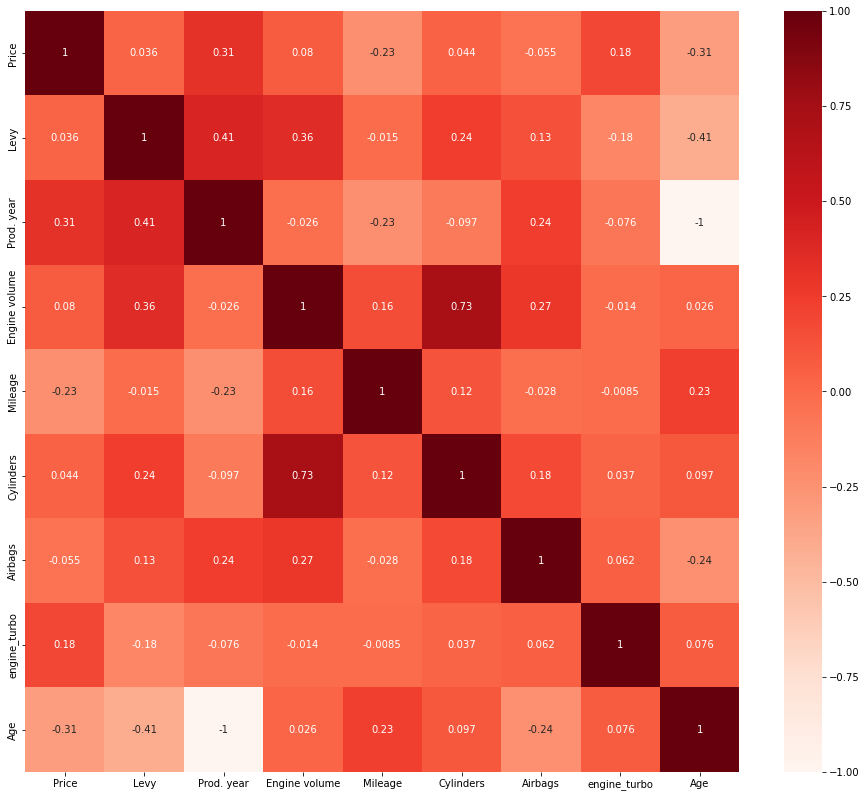

In [57]:
plt.figure(figsize=(16, 14))
sns.heatmap(data.corr(), cbar=True, annot=True, cmap='Reds')

<AxesSubplot:xlabel='Doors', ylabel='Price'>

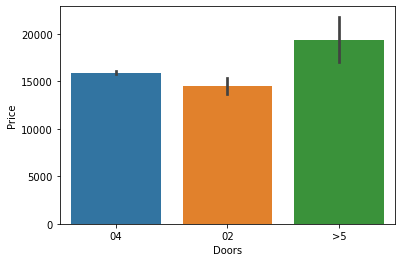

In [58]:
sns.barplot(data=data,y='Price',x='Doors')


In [59]:
category_count = data['Category'].value_counts(dropna = False)
category_count

Sedan          8736
Jeep           5473
Hatchback      2847
Minivan         647
Coupe           532
Universal       364
Microbus        306
Goods wagon     233
Pickup           52
Cabriolet        36
Limousine        11
Name: Category, dtype: int64

More data exploration to know the most used value in each feature with its avg. price


Category

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



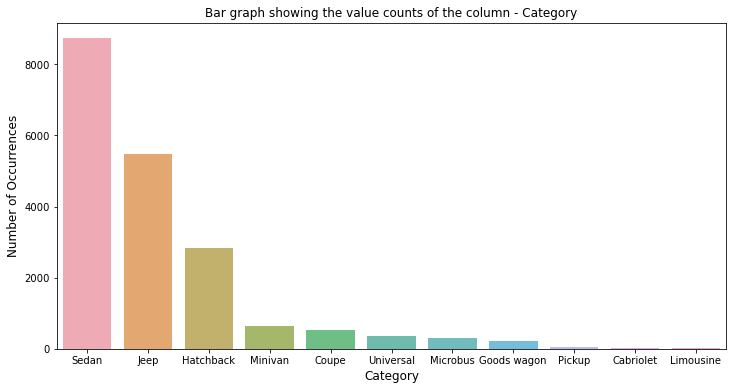

In [60]:
plt.figure(figsize = (12, 6))
sns.barplot(category_count.index, category_count.values, alpha = 0.8)
plt.title('Bar graph showing the value counts of the column - Category')
plt.ylabel('Number of Occurrences', fontsize = 12)
plt.xlabel('Category', fontsize = 12)
plt.show()

In [61]:
mean_price_category = data[['Category', 'Price']].groupby('Category', as_index = False).mean()
mean_price_category


,Category,Price
0,Cabriolet,21410.805556
1,Coupe,17748.345865
2,Goods wagon,9823.227468
3,Hatchback,11297.186161
4,Jeep,20824.445460
5,Limousine,11534.454545
6,Microbus,17843.506536
7,Minivan,20063.394127
8,Pickup,22955.269231
9,Sedan,13599.928800


Mean Price for each Category


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



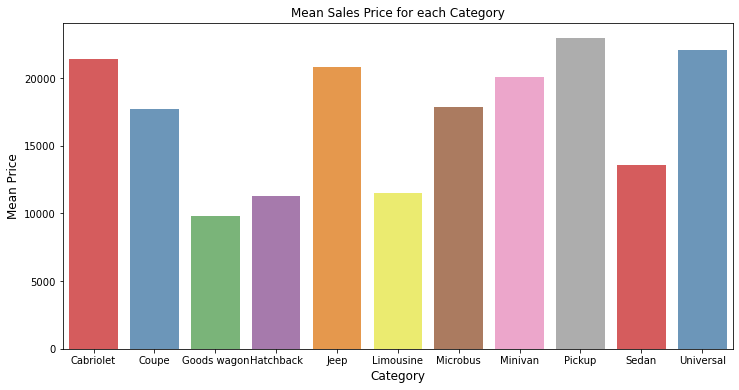

In [62]:
plt.figure(figsize = (12, 6))
sns.barplot(mean_price_category['Category'], mean_price_category['Price'], alpha = 0.8,palette='Set1')
plt.title('Mean Sales Price for each Category')
plt.ylabel('Mean Price', fontsize = 12)
plt.xlabel('Category', fontsize = 12)
plt.show()

Leather interior


In [63]:
interior_count=data['Leather interior'].value_counts()
interior_count

Yes    13954
No      5283
Name: Leather interior, dtype: int64

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



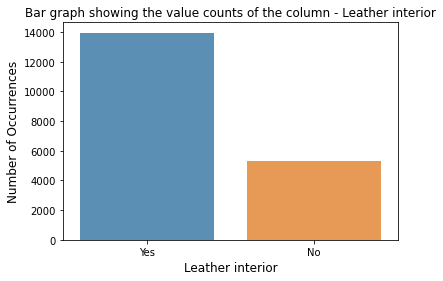

In [64]:
sns.barplot(interior_count.index, interior_count.values, alpha = 0.8)
plt.title('Bar graph showing the value counts of the column - Leather interior')
plt.ylabel('Number of Occurrences', fontsize = 12)
plt.xlabel('Leather interior', fontsize = 12)
plt.show()

Mean Price for each Leather interior


  Leather interior         Price
0               No  13134.719667
1              Yes  16902.656586


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



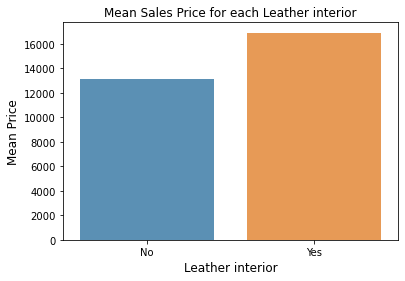

In [65]:
mean_price_interior = data[['Leather interior', 'Price']].groupby('Leather interior', as_index = False).mean()
print(mean_price_interior)
sns.barplot(mean_price_interior['Leather interior'], mean_price_interior['Price'], alpha = 0.8)
plt.title('Mean Sales Price for each Leather interior')
plt.ylabel('Mean Price', fontsize = 12)
plt.xlabel('Leather interior', fontsize = 12)
plt.show()

# Fuel type


In [66]:
fuel_count = data['Fuel type'].value_counts(dropna = False)
fuel_count

Petrol            10150
Diesel             4036
Hybrid             3578
LPG                 892
CNG                 494
Plug-in Hybrid       86
Hydrogen              1
Name: Fuel type, dtype: int64

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



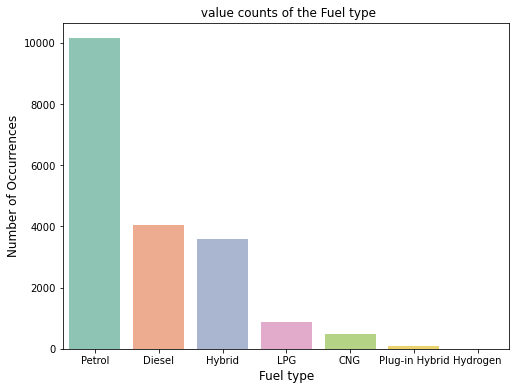

In [67]:
plt.figure(figsize = (8, 6))
sns.barplot(fuel_count.index, fuel_count.values, alpha = 0.8,palette='Set2')
plt.title(' value counts of the Fuel type')
plt.ylabel('Number of Occurrences', fontsize = 12)
plt.xlabel('Fuel type', fontsize = 12)
plt.show()

        Fuel type         Price
0             CNG   8509.591093
1          Diesel  22415.966303
2          Hybrid  10606.275014
3        Hydrogen  20385.000000
4             LPG  13195.745516
5          Petrol  15650.286700
6  Plug-in Hybrid  23083.302326


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



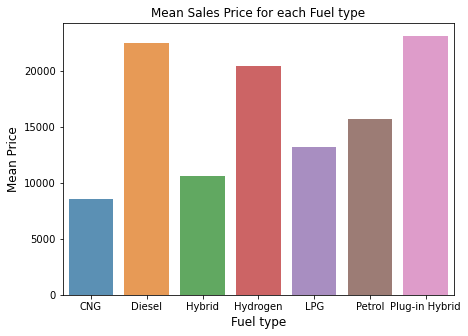

In [68]:
mean_price_fuel = data[['Fuel type', 'Price']].groupby('Fuel type', as_index = False).mean()
print(mean_price_fuel)
plt.figure(figsize = (7, 5))
sns.barplot(mean_price_fuel['Fuel type'], mean_price_fuel['Price'], alpha = 0.8)
plt.title('Mean Sales Price for each Fuel type')
plt.ylabel('Mean Price', fontsize = 12)
plt.xlabel('Fuel type', fontsize = 12)
plt.show()

Gear box type


Automatic    13282
Tiptronic     3065
Manual        1844
Variator       733
Name: Gear box type, dtype: int64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



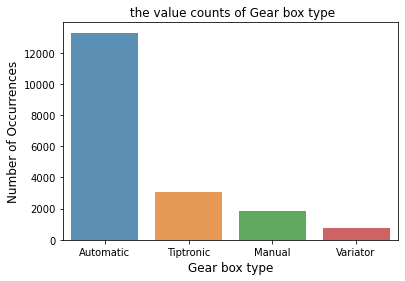

In [78]:
gear_count = data['Gear box type'].value_counts(dropna = False)
print(gear_count)
sns.barplot(gear_count.index, gear_count.values, alpha = 0.8)
plt.title(' the value counts of Gear box type')
plt.ylabel('Number of Occurrences', fontsize = 12)
plt.xlabel('Gear box type', fontsize = 12)
plt.show()

Mean Price for each Gear box type


  Gear box type         Price
0     Automatic  15096.098479
1        Manual  11244.390998
2     Tiptronic  22388.666232
3      Variator  14560.694407


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



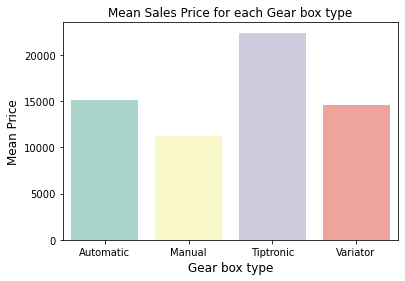

In [79]:
mean_price_gear = data[['Gear box type', 'Price']].groupby('Gear box type', as_index = False).mean()
print(mean_price_gear)
sns.barplot(mean_price_gear['Gear box type'], mean_price_gear['Price'], alpha = 0.8,palette='Set3')
plt.title('Mean Sales Price for each Gear box type')
plt.ylabel('Mean Price', fontsize = 12)
plt.xlabel('Gear box type', fontsize = 12)
plt.show()

# Drive wheels


Front    12695
4x4       3969
Rear      2260
Name: Drive wheels, dtype: int64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



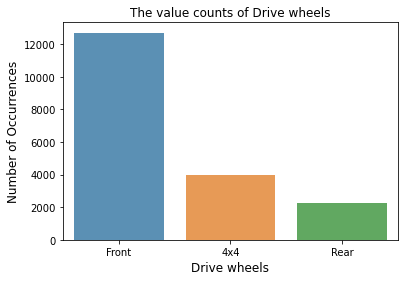

In [81]:
drive_count = data['Drive wheels'].value_counts(dropna = False)
print(data['Drive wheels'].value_counts())
sns.barplot(drive_count.index, drive_count.values, alpha = 0.8)
plt.title('The value counts of Drive wheels')
plt.ylabel('Number of Occurrences', fontsize = 12)
plt.xlabel('Drive wheels', fontsize = 12)
plt.show()

Mean price per each Drive wheels

### Color

Black            4944
White            4407
Silver           3729
Grey             2343
Blue             1376
Red               622
Green             321
Orange            252
Brown             185
Carnelian red     177
Golden            143
Beige             134
Sky blue          122
Yellow            105
Purple             39
Pink               25
Name: Color, dtype: int64


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



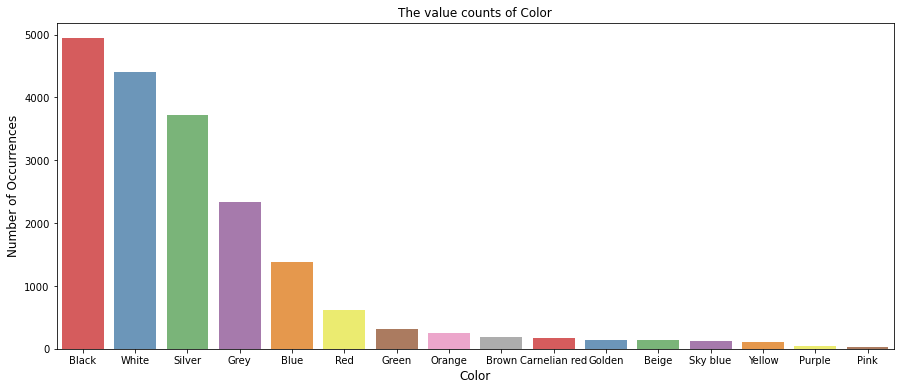

In [82]:
color_count = data['Color'].value_counts(dropna = False)
print(color_count)
plt.figure(figsize = (15, 6))
sns.barplot(color_count.index, color_count.values, alpha = 0.8,palette="Set1")
plt.title('The value counts of Color')
plt.ylabel('Number of Occurrences', fontsize = 12)
plt.xlabel('Color', fontsize = 12)
plt.show()

### Mean price per each Color

            Color         Price
0           Beige  15282.402985
1           Black  16674.445995
2            Blue  14214.250000
3           Brown  17898.827027
4   Carnelian red  15348.146893
5          Golden  14328.384615
6           Green   9261.897196
7            Grey  17790.931285
8          Orange  12154.178571
9            Pink  10377.320000
10         Purple   8837.384615
11            Red  13240.823151
12         Silver  14707.495307
13       Sky blue  14036.278689
14          White  16637.349671
15         Yellow  18817.904762


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



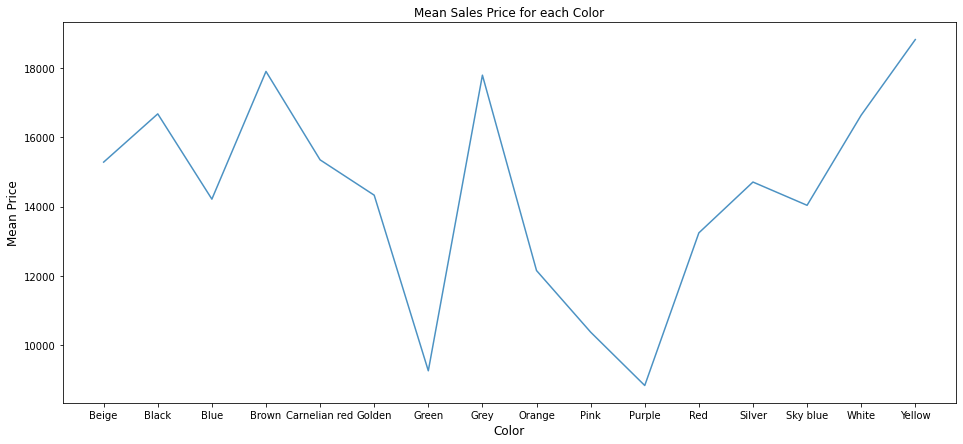

In [83]:
mean_price_color = data[['Color', 'Price']].groupby('Color', as_index = False).mean()
print(mean_price_color)
plt.figure(figsize = (16, 7))
sns.lineplot(mean_price_color['Color'], mean_price_color['Price'], alpha = 0.8)
plt.title('Mean Sales Price for each Color')
plt.ylabel('Mean Price', fontsize = 12)
plt.xlabel('Color', fontsize = 12)
plt.show()

### Encoding


In [84]:
from sklearn.preprocessing import LabelEncoder


In [85]:
Manufacturer_le = LabelEncoder()
Model_le = LabelEncoder()
Category_le = LabelEncoder()
Leather_interior_le = LabelEncoder()
Fuel_type_le = LabelEncoder()
Gear_box_type_le = LabelEncoder()
Doors_le  = LabelEncoder()
Wheel_le  = LabelEncoder() 
Drive_wheels_le = LabelEncoder() 
color_le = LabelEncoder()  

In [86]:
data['Manufacturer'] = Manufacturer_le.fit_transform(data['Manufacturer'])
data['Model'] = Model_le.fit_transform(data['Model'])
data['Category'] = Category_le.fit_transform(data['Category'])
data['Leather interior'] = Leather_interior_le.fit_transform(data['Leather interior'])
data['Fuel type'] = Fuel_type_le.fit_transform(data['Fuel type'])
data['Gear box type'] = Gear_box_type_le.fit_transform(data['Gear box type'])
data['Doors'] = Doors_le.fit_transform(data['Doors'])
data['Wheel'] = Wheel_le.fit_transform(data['Wheel'])
data['Drive wheels'] = Drive_wheels_le.fit_transform(data['Drive wheels'])
data['Color'] = color_le.fit_transform(data['Color'])


In [87]:
data


,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags,engine_turbo,Age
0,13328.0,1399.0,32,1242,2010,4,1,2,3.5,186005.0,6.0,0,0,1,0,12,12.0,0,10
1,16621.0,1018.0,8,658,2011,4,0,5,3.0,192000.0,6.0,2,0,1,0,1,8.0,0,9
2,8467.0,0.0,21,684,2006,3,0,5,1.3,200000.0,4.0,3,1,1,1,1,2.0,0,14
3,3607.0,862.0,16,661,2011,4,1,2,2.5,168966.0,4.0,0,0,1,0,14,0.0,0,9
4,11726.0,446.0,21,684,2014,3,1,5,1.3,91901.0,4.0,0,1,1,0,12,4.0,0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19232,8467.0,0.0,36,385,1999,1,1,0,2.0,300000.0,4.0,1,2,0,0,12,5.0,1,21
19233,15681.0,831.0,23,1334,2011,9,1,5,2.4,161600.0,4.0,2,1,1,0,11,8.0,0,9
19234,26108.0,836.0,23,1442,2010,4,1,1,2.0,116365.0,4.0,0,1,1,0,7,4.0,0,10
19235,5331.0,1288.0,8,456,2007,4,1,1,2.0,51258.0,4.0,0,1,1,0,1,4.0,0,13


<AxesSubplot:>

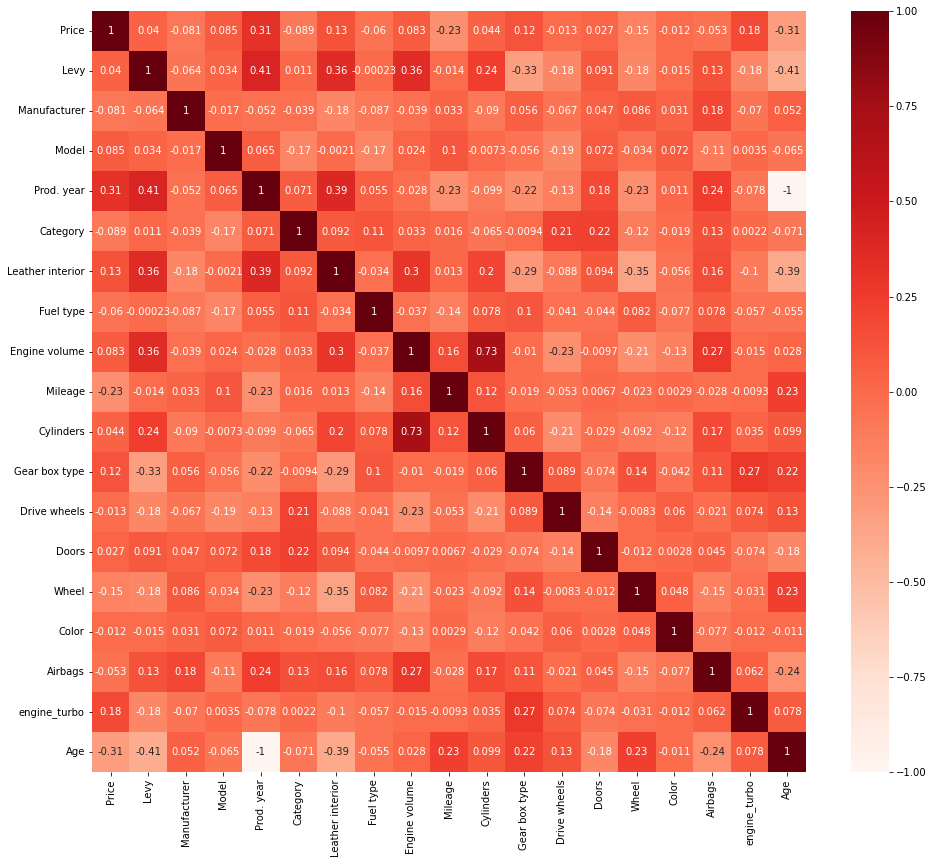

In [88]:
plt.figure(figsize=(16, 14))
sns.heatmap(data.corr(), cbar=True, annot=True, cmap='Reds')

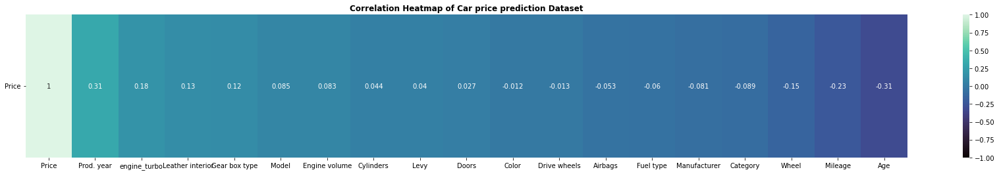

In [89]:
Target_corr  = data.corr().loc[:, 'Price'].to_frame().sort_values(by = 'Price' , ascending=False).T
plt.figure(figsize=(30,4))
plot = sns.heatmap(Target_corr, annot=True, cmap='mako', vmin = -1)
plt.title('Correlation Heatmap of Car price prediction Dataset', weight='bold')
plot.set_xticklabels(plot.get_xticklabels(), rotation=0, horizontalalignment='center')
plot.set_yticklabels(plot.get_yticklabels(), rotation=0, horizontalalignment='right')
plt.show()

dropping fuel type , Manufacturce and prod. year because their relation with the price is approximately to zero

In [90]:
data = data.drop(['Fuel type','Manufacturer','Prod. year'],axis=1)


In [91]:
data


,Price,Levy,Model,Category,Leather interior,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags,engine_turbo,Age
0,13328.0,1399.0,1242,4,1,3.5,186005.0,6.0,0,0,1,0,12,12.0,0,10
1,16621.0,1018.0,658,4,0,3.0,192000.0,6.0,2,0,1,0,1,8.0,0,9
2,8467.0,0.0,684,3,0,1.3,200000.0,4.0,3,1,1,1,1,2.0,0,14
3,3607.0,862.0,661,4,1,2.5,168966.0,4.0,0,0,1,0,14,0.0,0,9
4,11726.0,446.0,684,3,1,1.3,91901.0,4.0,0,1,1,0,12,4.0,0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19232,8467.0,0.0,385,1,1,2.0,300000.0,4.0,1,2,0,0,12,5.0,1,21
19233,15681.0,831.0,1334,9,1,2.4,161600.0,4.0,2,1,1,0,11,8.0,0,9
19234,26108.0,836.0,1442,4,1,2.0,116365.0,4.0,0,1,1,0,7,4.0,0,10
19235,5331.0,1288.0,456,4,1,2.0,51258.0,4.0,0,1,1,0,1,4.0,0,13


# Modelling


Splitting the data to Training and Test


In [92]:
X = data.drop('Price',axis=1).values
Y = data['Price'].values

In [93]:
from sklearn.model_selection import train_test_split


In [94]:
x_train , x_test , y_train , y_test = train_test_split(X,Y , test_size= 0.25 ,random_state=42)

Now Scale the data using MinMaxScaler


In [95]:
from sklearn.preprocessing import MinMaxScaler


In [96]:
scaler = MinMaxScaler()


In [97]:
x_train = scaler.fit_transform(x_train)
x_test  = scaler.transform(x_test)

In [98]:
x_train.shape


(14193, 15)

In [99]:
y_train.shape


(14193,)

In [100]:
y_test.shape


(4731,)

In [101]:
from sklearn.linear_model import LinearRegression


In [102]:
linear_regressor = LinearRegression()
linear_regressor.fit(x_train, y_train)

LinearRegression()

In [103]:
linear_regressor.score(x_train,y_train)

0.2831479246758877

In [104]:
linear_regressor.score(x_test,y_test)

0.25258618259398635

accurcy is not good


In [105]:
y_pred = linear_regressor.predict(x_test)


In [106]:
LR = pd.DataFrame({'y_test':y_test,'y_pred':y_pred})
LR.head()

,y_test,y_pred
0,11604.0,16589.975307
1,470.0,9688.995900
2,20162.0,21338.278059
3,7527.0,-673.211834
4,18817.0,19727.225666


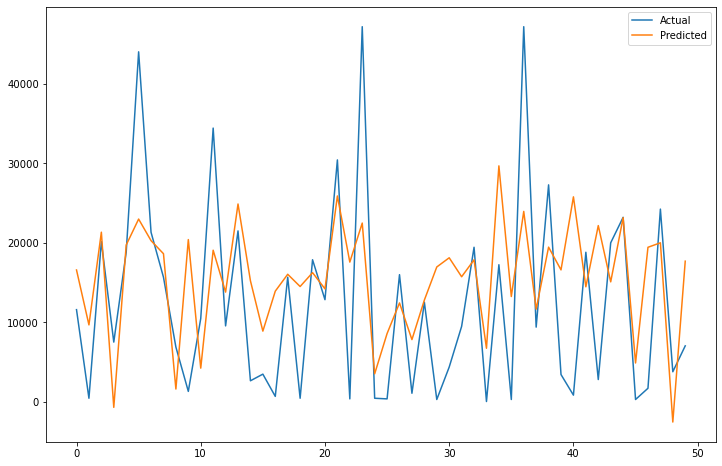

In [107]:
plt.figure(figsize=(12,8))
plt.plot(LR[:50])
plt.legend(['Actual' , 'Predicted'])

In [113]:
mae = round(mean_absolute_error(y_test, y_pred), 3)
mse = round(mean_squared_error(y_test, y_pred), 3)
rmse = round(sqrt(mse), 3)

r2_value = round(r2_score(y_test, y_pred), 3)

print('Mean Absolute Error  of the model is : {}'.format(mae))
print('Mean Squared Error of the model is : {}'.format(mse))
print('Root Mean Squared Error of the model is : {}'.format(rmse))
print('R-squared value of the model is : {}'.format(r2_value))

Mean Absolute Error  of the model is : 8932.226
Mean Squared Error of the model is : 134732750.532
Root Mean Squared Error of the model is : 11607.444
R-squared value of the model is : 0.253


## using Random Forest

In [114]:
from sklearn.ensemble  import RandomForestRegressor


In [115]:
random_forest_regressor = RandomForestRegressor(n_estimators = 100, random_state = 27)
random_forest_regressor.fit(x_train, y_train)
print(random_forest_regressor.score(x_train , y_train))
print(random_forest_regressor.score(x_test , y_test))

0.9577276136566242
0.7839589598775559


In [116]:
y_pred = random_forest_regressor.predict(x_test)

In [117]:
RF = pd.DataFrame({'y_test':y_test,'y_pred':y_pred})

In [118]:
RF.head()


,y_test,y_pred
0,11604.0,16487.91
1,470.0,1114.99
2,20162.0,22023.26
3,7527.0,6096.70
4,18817.0,10703.47


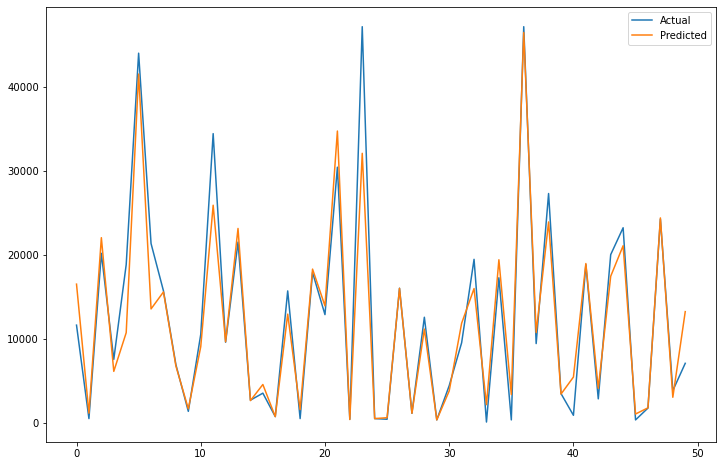

In [119]:
plt.figure(figsize=(12,8))
plt.plot(RF[:50])
plt.legend(['Actual' , 'Predicted'])

In [120]:
mae = round(mean_absolute_error(y_test, y_pred), 3)
mse = round(mean_squared_error(y_test, y_pred), 3)
rmse = round(sqrt(mse), 3)

r2_value = round(r2_score(y_test, y_pred), 3)

print('Mean Absolute Error  of the model is : {}'.format(mae))
print('Mean Squared Error of the model is : {}'.format(mse))
print('Root Mean Squared Error of the model is : {}'.format(rmse))
print('R-squared value of the model is : {}'.format(r2_value))

Mean Absolute Error  of the model is : 3653.191
Mean Squared Error of the model is : 38944695.543
Root Mean Squared Error of the model is : 6240.569
R-squared value of the model is : 0.784


# using Gradien Boost


In [121]:
from sklearn.ensemble import GradientBoostingRegressor
gbr = GradientBoostingRegressor(n_estimators=500,learning_rate=0.3)
gbr.fit(x_train, y_train)

GradientBoostingRegressor(learning_rate=0.3, n_estimators=500)

In [122]:
gbr.score(x_train,y_train)

0.8458684458070305

In [123]:
gbr.score(x_test,y_test)


0.7431931989699755

In [124]:
y_pred = gbr.predict(x_test)
y_pred = gbr.predict(x_test)
gbx= pd.DataFrame({'y_test':y_test,'y_pred':y_pred})
gbx.head()

,y_test,y_pred
0,11604.0,15164.890981
1,470.0,307.341487
2,20162.0,24831.278819
3,7527.0,10705.583643
4,18817.0,12236.679285


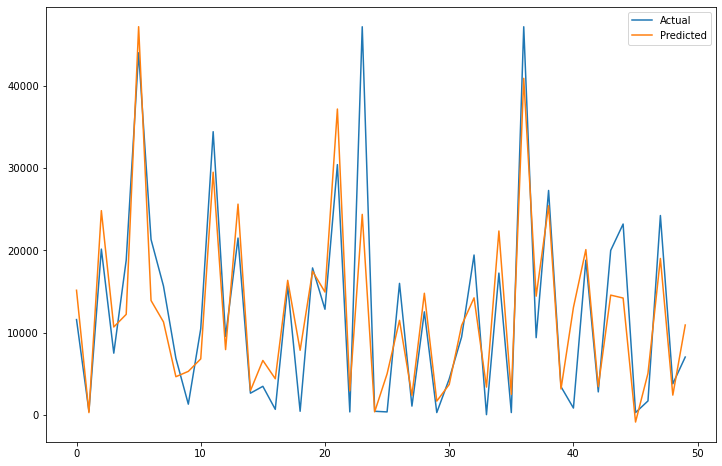

In [125]:
plt.figure(figsize=(12,8))
plt.plot(gbx[:50])
plt.legend(['Actual' , 'Predicted'])

In [126]:
mae = round(mean_absolute_error(y_test, y_pred), 3)
mse = round(mean_squared_error(y_test, y_pred), 3)
rmse = round(sqrt(mse), 3)

r2_value = round(r2_score(y_test, y_pred), 3)

print('Mean Absolute Error  of the model is : {}'.format(mae))
print('Mean Squared Error of the model is : {}'.format(mse))
print('Root Mean Squared Error of the model is : {}'.format(rmse))
print('R-squared value of the model is : {}'.format(r2_value))

Mean Absolute Error  of the model is : 4539.977
Mean Squared Error of the model is : 46293346.272
Root Mean Squared Error of the model is : 6803.921
R-squared value of the model is : 0.743


In [132]:
for i, model in enumerate(pipelines):
    print(f'{pipe_dict[i]} has test accuracy: {round(model.score(x_test, y_test),3)}')
    print(f'{pipe_dict[i]} has train accuracy: {round(model.score(x_train, y_train),3)}')
    print('')

Linear Regression has test accuracy: 0.253
Linear Regression has train accuracy: 0.283

Gradient Boost has test accuracy: 0.743
Gradient Boost has train accuracy: 0.846

Random Forest Regression has test accuracy: 0.759
Random Forest Regression has train accuracy: 0.88

